## Data Collection/Processing


In [1]:
import pandas as pd

fields = ['tpep_pickup_datetime', 'tpep_dropoff_datetime', 'passenger_count', 'trip_distance', 'pickup_longitude', 
          'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'fare_amount', 'tip_amount', 'total_amount']
uber_data = pd.read_csv('yellow_tripdata_2015-07.csv', usecols = fields)
uber_data = uber_data[(uber_data['pickup_longitude'] < -70) & (uber_data['pickup_longitude'] > -80)]

In [2]:
#uber_data.describe() #yellow_tripdata_2015-07.csv
uber_data

,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,fare_amount,tip_amount,total_amount
0,2015-07-01 00:00:00,2015-07-01 00:15:26,1,3.5,-73.994156,40.751125,-73.976822,40.788567,14.0,0.00,15.30
1,2015-07-01 00:00:00,2015-07-01 00:22:22,1,3.9,-73.984657,40.768486,-74.000130,40.734898,17.0,0.00,18.30
2,2015-07-01 00:00:00,2015-07-01 00:07:42,1,2.3,-73.978889,40.762287,-74.004219,40.752533,9.0,0.00,10.30
3,2015-07-01 00:00:00,2015-07-01 00:39:37,1,9.2,-73.992790,40.742760,-73.971512,40.637154,33.0,8.55,42.85
4,2015-07-01 00:00:00,2015-07-01 00:05:34,1,1.1,-73.912430,40.769810,-73.920334,40.757442,6.0,2.00,9.30
...,...,...,...,...,...,...,...,...,...,...,...
11562778,2015-07-02 13:05:48,2015-07-02 13:11:49,1,1.2,-73.992088,40.750309,-73.977379,40.755611,6.5,1.46,8.76
11562779,2015-07-02 13:18:22,2015-07-02 13:24:45,2,1.8,-73.991226,40.749954,-73.971886,40.764286,7.5,0.00,8.30
11562780,2015-07-02 13:36:18,2015-07-02 13:41:39,1,1.2,-73.992027,40.749550,-73.979042,40.758713,6.0,1.70,8.50
11562781,2015-07-02 13:50:05,2015-07-02 13:54:01,1,0.8,-73.991669,40.749157,-73.980186,40.748360,5.0,0.00,5.80


## Find the nearby pickyups in the dataset in specific time

In [6]:
import numpy as np
from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent="http")

location = geolocator.geocode("Broadway Theatre")
print((location.latitude, location.longitude))

pickups = uber_data[(uber_data['pickup_longitude'] < location.longitude + 0.002) & (uber_data['pickup_longitude'] > location.longitude - 0.002)
                    & (uber_data['pickup_latitude'] < location.latitude + 0.001) & (uber_data['pickup_latitude'] > location.latitude - 0.001)
                    & uber_data['tpep_pickup_datetime'].str.contains(" 22:")]

print(len(pickups.index), "pick-ups near", location.address)
print("between 22:00 to 23:00")

print("average passenger number of the selected pick-ups is", np.mean(pickups['passenger_count'].tolist()))
print("average trip distance of the selected pick-ups is", np.mean(pickups['trip_distance'].tolist()))
print("average tip amount earned in the selected pick-ups is", np.mean(pickups['tip_amount'].tolist()))
print("average total earnings in the selected pick-ups is", np.mean(pickups['total_amount'].tolist()))

(40.76339815, -73.98335504506701)
3309 pick-ups near Broadway Theatre, 1681, Broadway, Theater District, Manhattan, New York County, New York, 10019, United States
between 22:00 to 23:00
average passenger number of the selected pick-ups is 1.733756421879722
average trip distance of the selected pick-ups is 2.617878513145966
average tip amount earned in the selected pick-ups is 1.5461589604110002
average total earnings in the selected pick-ups is 15.038646116651558


## Displaying pickup and drop off location on Map

In [7]:
pickup_location = pickups[['pickup_latitude', 'pickup_longitude']]
dropoff_location = pickups[['dropoff_latitude', 'dropoff_longitude']]

import folium
import pandas as pd

map_kenya = folium.Map(location=[40.765650, -73.984340], zoom_start=15)

for index, loc2 in dropoff_location.iterrows():
    location2 = [loc2['dropoff_latitude'], loc2['dropoff_longitude']]
    folium.Circle(location2, radius=0.5, color="green", fill=False,).add_to(map_kenya)
for index, loc1 in pickup_location.iterrows():
    location1 = [loc1['pickup_latitude'], loc1['pickup_longitude']]
    folium.Circle(location1, radius=0.5, color="red", fill=False,).add_to(map_kenya)

    

map_kenya

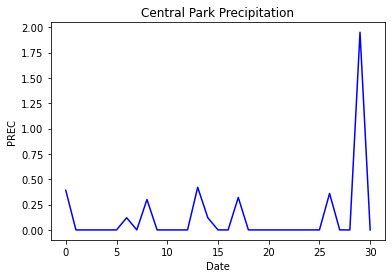

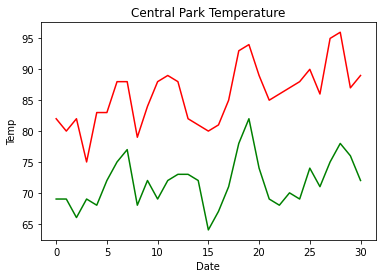

In [14]:
weather_data = pd.read_csv('central_park_weather_new.csv')
weather_data = weather_data[(weather_data['DATE'] > 20150700) & (weather_data['DATE'] < 20150800)]
weather_data.head()

date = range(0, len(weather_data.index))
precipitation = weather_data["PRCP"]
tmax = weather_data["TMAX"]
tmin = weather_data["TMIN"]

plt.title ("Central Park Precipitation")
plt.plot(date, precipitation, color = "blue")
plt.xlabel("Date")
plt.ylabel("PREC")
plt.show()

plt.title ("Central Park Temperature")
plt.plot(date, tmax, color = "red")
plt.plot(date, tmin, color = "green")
plt.xlabel("Date")
plt.ylabel("Temp")
plt.show()



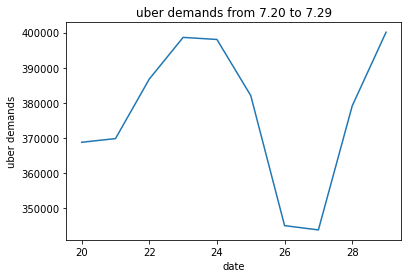

In [18]:
uber_0720 = uber_data[uber_data['tpep_pickup_datetime'].str.contains("2015-07-20")]
uber_0721 = uber_data[uber_data['tpep_pickup_datetime'].str.contains("2015-07-21")]
uber_0722 = uber_data[uber_data['tpep_pickup_datetime'].str.contains("2015-07-22")]
uber_0723 = uber_data[uber_data['tpep_pickup_datetime'].str.contains("2015-07-23")]
uber_0724 = uber_data[uber_data['tpep_pickup_datetime'].str.contains("2015-07-24")]
uber_0725 = uber_data[uber_data['tpep_pickup_datetime'].str.contains("2015-07-25")]
uber_0726 = uber_data[uber_data['tpep_pickup_datetime'].str.contains("2015-07-26")]
uber_0727 = uber_data[uber_data['tpep_pickup_datetime'].str.contains("2015-07-27")]
uber_0728 = uber_data[uber_data['tpep_pickup_datetime'].str.contains("2015-07-28")]
uber_0729 = uber_data[uber_data['tpep_pickup_datetime'].str.contains("2015-07-29")]

uber_amount = [len(uber_0720.index), len(uber_0721.index), len(uber_0722.index), 
               len(uber_0723.index), len(uber_0724.index), len(uber_0725.index), 
               len(uber_0726.index), len(uber_0727.index), len(uber_0728.index), 
               len(uber_0729.index)]
x = range(20,30)
plt.title("uber demands from 7.20 to 7.29")
plt.plot(x, uber_amount)
plt.xlabel("date")
plt.ylabel("uber demands")
plt.show()

In [10]:
pickup = uber_0729[['pickup_latitude', 'pickup_longitude']].head(5000)

In [11]:
for index, row in pickup.iterrows():
    data = ([row[0]], [row[1]])
    print(data)

([40.7332878112793], [-74.00630950927734])
([40.76690673828125], [-73.96710205078125])
([40.76264190673828], [-73.98124694824217])
([40.751197814941406], [-73.98688507080078])
([40.72547149658203], [-73.98677062988281])
([40.7603759765625], [-73.97592163085938])
([40.75265884399414], [-73.98577117919923])
([40.75251007080078], [-73.99284362792967])
([40.748340606689446], [-73.98445129394531])
([40.75149917602539], [-73.9716567993164])
([40.75929641723633], [-73.98471069335938])
([40.74722290039063], [-73.97414398193358])
([40.74687194824219], [-73.98488616943358])
([40.751609802246094], [-73.97679138183594])
([40.72848129272461], [-74.00479125976561])
([40.73922348022461], [-74.00141906738281])
([40.755821228027344], [-73.976318359375])
([40.73802185058594], [-73.99234008789062])
([40.75535583496094], [-73.96813201904298])
([40.770069122314446], [-73.86383819580078])
([40.76356506347656], [-73.95911407470702])
([40.75830078125], [-73.98155212402342])
([40.72428131103516], [-73.99240875

([40.745620727539055], [-73.98247528076173])
([40.754302978515625], [-73.9744644165039])
([40.716121673583984], [-74.00133514404298])
([40.66735458374024], [-73.80340576171875])
([40.74574661254882], [-73.98836517333984])
([40.73124313354492], [-74.00304412841797])
([40.71824645996094], [-74.00531005859375])
([40.731460571289055], [-73.98575592041014])
([40.75247573852539], [-73.97822570800781])
([40.759647369384766], [-73.97521209716798])
([40.7546272277832], [-73.97000885009764])
([40.74966812133789], [-73.9793472290039])
([40.743900299072266], [-73.98167419433594])
([40.762149810791016], [-73.96614837646483])
([40.75029754638672], [-73.99195098876953])
([40.76470565795898], [-73.97710418701173])
([40.71686172485352], [-74.00906372070312])
([40.79922866821289], [-73.96853637695312])
([40.741260528564446], [-73.99112701416014])
([40.75082778930664], [-73.97647857666014])
([40.645553588867195], [-73.79145812988281])
([40.67784881591797], [-73.97284698486328])
([40.7821044921875], [-73.

([40.72130584716797], [-73.99706268310547])
([40.73249816894531], [-73.98491668701173])
([40.72222900390625], [-73.94993591308595])
([40.81388473510742], [-73.95665740966798])
([40.715850830078125], [-74.00865173339844])
([40.75126266479492], [-73.9940185546875])
([40.70961380004882], [-74.0118408203125])
([40.7734260559082], [-73.91435241699219])
([40.73640823364258], [-73.98480224609375])
([40.73556137084961], [-73.99262237548828])
([40.73860168457031], [-73.98347473144531])
([40.759315490722656], [-73.96808624267578])
([40.734840393066406], [-73.99201202392578])
([40.73025131225586], [-73.98342895507811])
([40.78318405151367], [-73.98210906982422])
([40.77445602416992], [-73.94822692871094])
([40.75307083129882], [-73.97003173828125])
([40.773738861083984], [-73.87100982666014])
([40.75922775268555], [-73.96742248535155])
([40.75934982299805], [-73.98846435546875])
([40.730781555175774], [-74.00094604492188])
([40.77846145629882], [-73.9510498046875])
([40.761756896972656], [-73.985

([40.776981353759766], [-73.98684692382812])
([40.752628326416016], [-73.97940063476561])
([40.74527740478516], [-74.00225067138672])
([40.72429656982422], [-73.9973907470703])
([40.76744079589844], [-73.98614501953125])
([40.7626838684082], [-73.983642578125])
([40.777305603027344], [-73.97862243652342])
([40.731830596923835], [-73.98381042480467])
([40.729278564453125], [-73.98741149902342])
([40.74166488647461], [-73.99568939208984])
([40.72154235839844], [-73.99742126464844])
([40.75719833374024], [-73.96709442138672])
([40.72025680541992], [-73.99420166015625])
([40.720260620117195], [-74.00853729248048])
([40.72940826416016], [-73.98702239990233])
([40.72087097167969], [-74.00493621826173])
([40.74047088623047], [-73.98177337646483])
([40.668731689453125], [-73.98992156982422])
([40.72338485717773], [-74.00273132324217])
([40.73044204711913], [-73.98027038574217])
([40.74415969848633], [-73.97625732421875])
([40.74524688720703], [-73.99433135986328])
([40.72847366333008], [-73.98

# PickUp Location on 29th July 2015

In [12]:
import folium
import pandas as pd
m = folium.Map([40.765650, -73.984340], zoom_start=11)

for index, row in pickup.iterrows():
    folium.Circle([row['pickup_latitude'], row['pickup_longitude']], radius=10, fill=True).add_to(m)
m

# Heat Map

In [13]:
from folium.plugins import HeatMap
HeatMap(pickup).add_to(m)
m